# Notebook Exploration des Données

l'analyse se concentre sur la zone 10N-123W-45N, car c'est la seule zone que j'ai téléchargée localement de la base de données (trop volumineux autrement).

### Prise en main des fichiers tiffs 

"" The dataset contains daily Planet Fusion imagery with monthly land cover classes for 75 areas across the globe over two years. The seven land cover classes were manually annotated in a temporally consistent way.  ""

In [2]:
import sys
import os
from pathlib import Path

import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import pandas as pd
# gdal
#pyproj 
%load_ext autoreload
%autoreload 2

sys.path.append(os.path.abspath("src"))

from sat_image_reader import SatImageReader
from classes_reader import ClassesReader


In [2]:
path_dataset = "../../../../tsi/data_education/fil_rouge_Airbus_2025/dynamic_earth_net/"
path_testdata = "planet.10N/planet/10N/19E-211N/1286_2921_13/PF-SR/"
path_label = "labels/labels/1311_3077_13_10N/Labels/Raster/10N-122W-40N-L3H-SR/10N-122W-40N-L3H-SR-2018_01_01.tif"

path = path_dataset + path_label

In [3]:
with rasterio.open(path) as dataset:
    
    print("Métadonnées:", dataset.meta)


Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


Nombre de bandes: 7


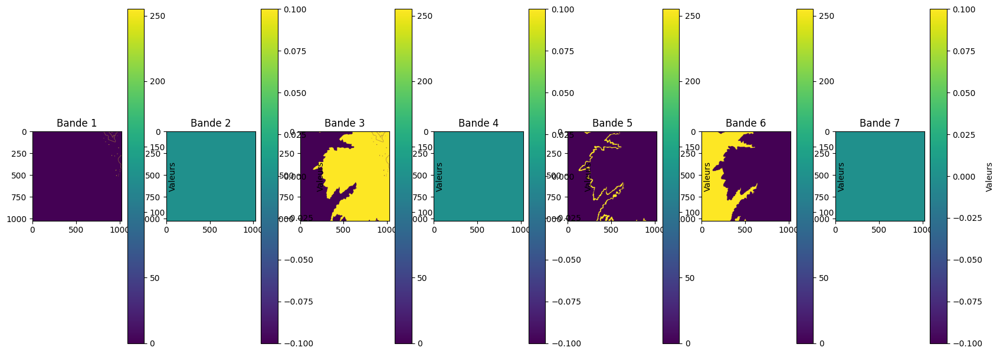

In [4]:

with rasterio.open(path) as dataset:
    n_band = dataset.count
    print("Nombre de bandes:", n_band)
    plt.subplots(1, n_band, figsize=(20, 10))
    for i in range(1, n_band+1):
        band = dataset.read(i)
        plt.subplot(1, n_band, i)
        plt.imshow(band)
        plt.colorbar(label='Valeurs')
        plt.title(f'Bande {i}')
        
    plt.show()
    

On remarque que sur cette zone seulement 3 classes de 7 sont présentes. Les noms des classes sont visibles dans le folder 'vector'.

 - [ ] La bande 1 correspond à "Impervious Surface". 
 - [ ] La bande 3 correspond à "Forest and other Vegetation".
 - [ ] La bande 5 correspond à "Soil". 

#### visualisation des évolutions temporelles 

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


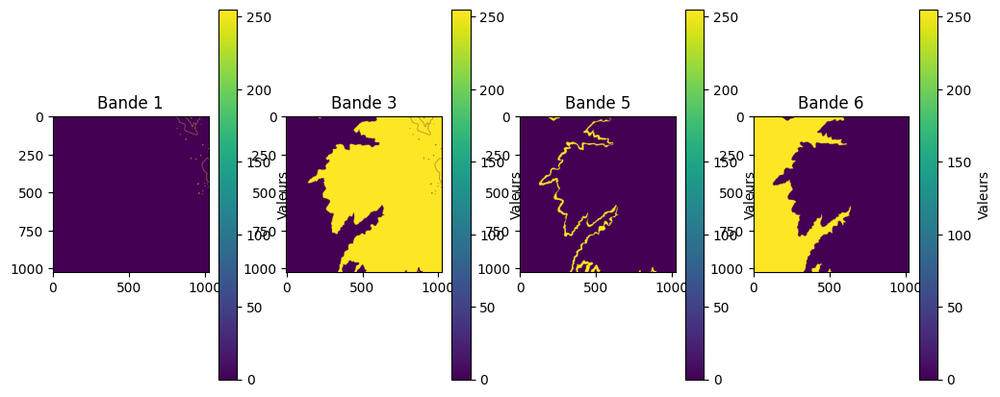

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


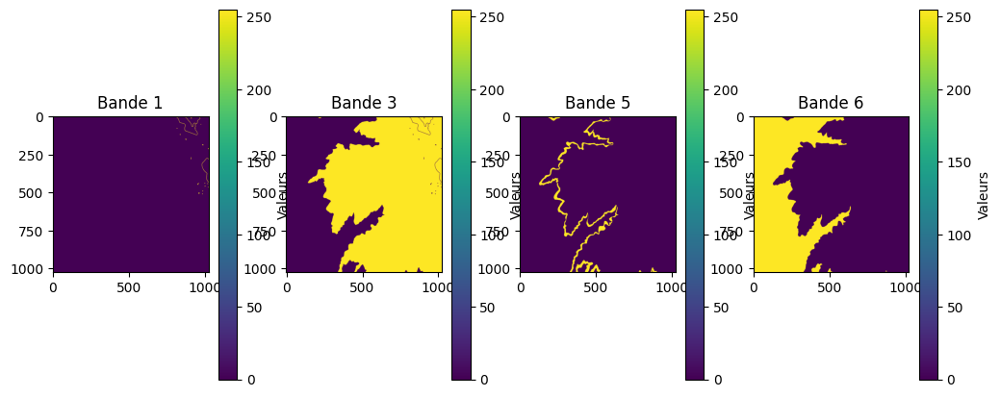

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


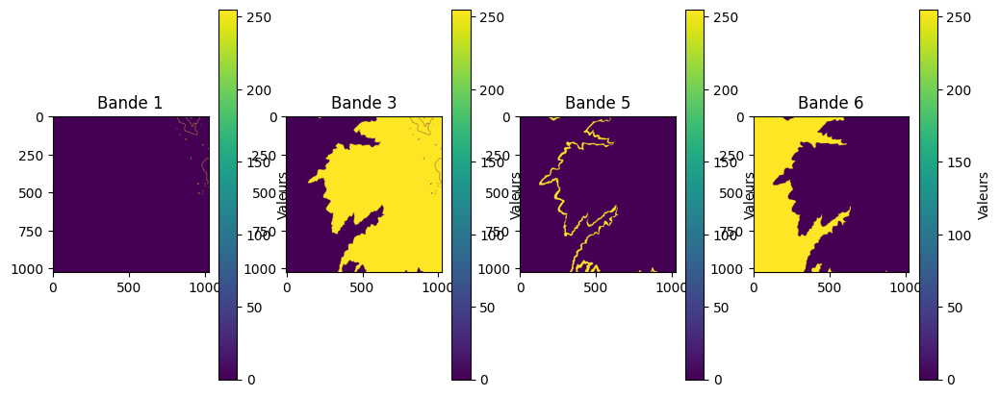

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


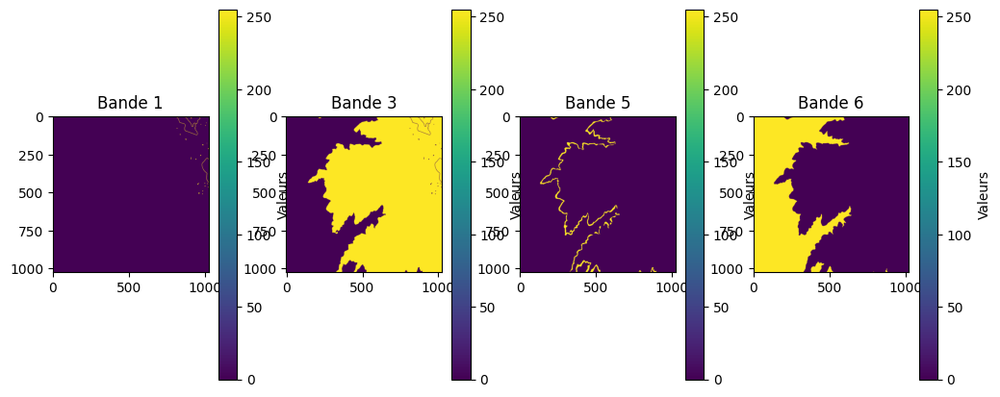

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


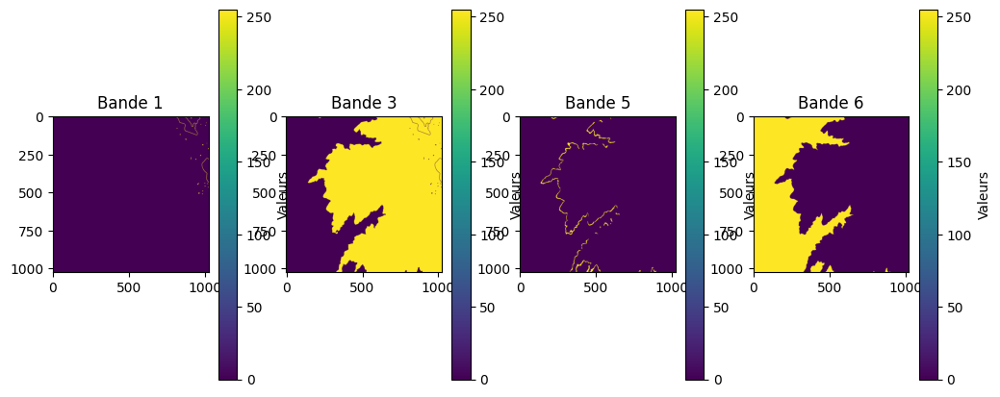

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


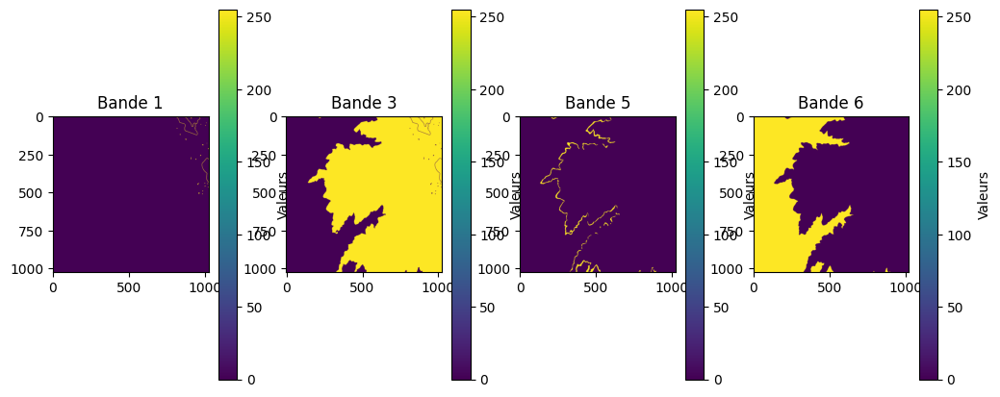

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


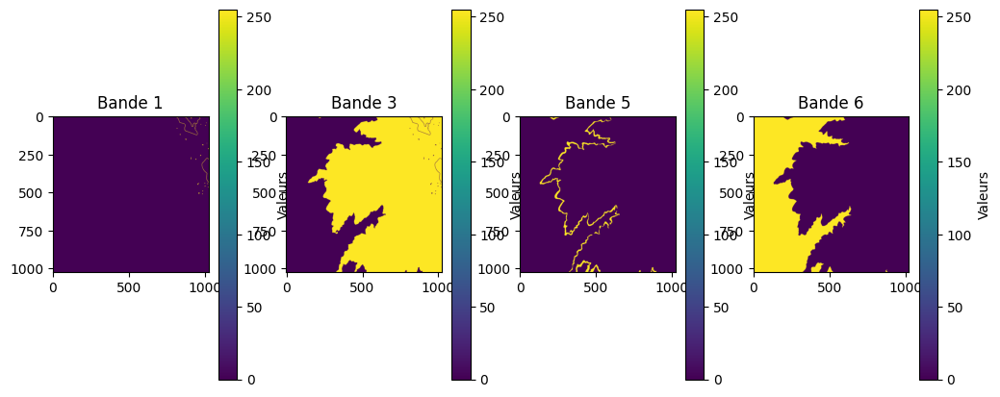

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


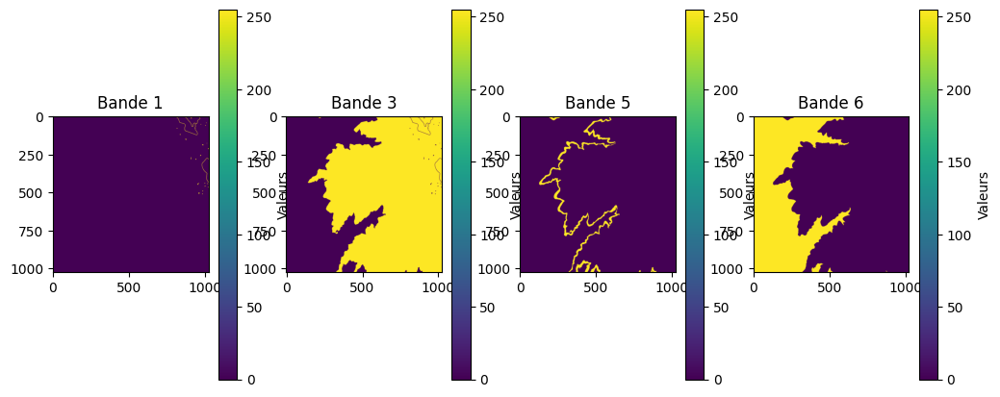

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


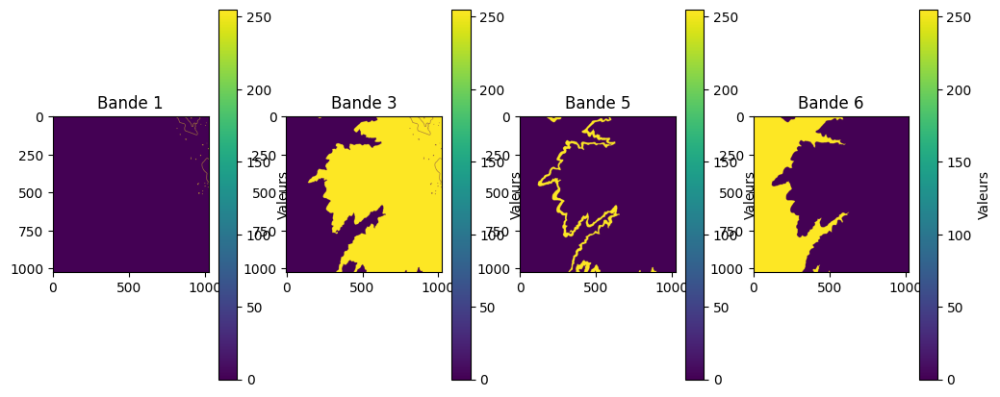

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


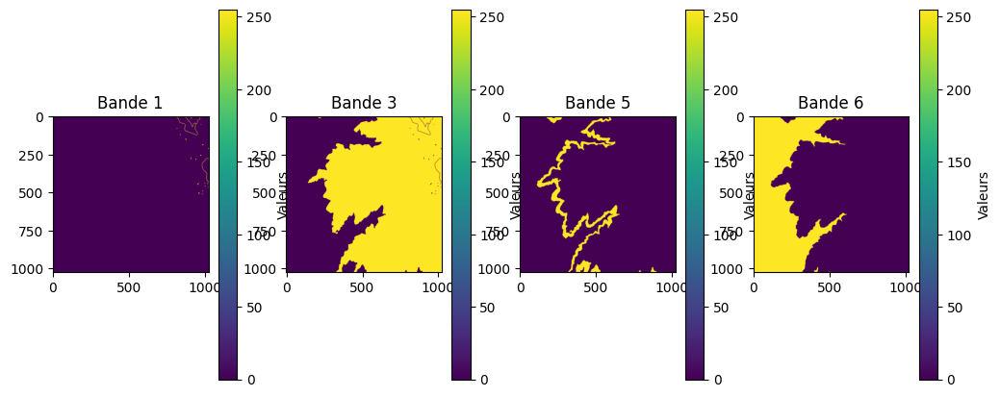

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


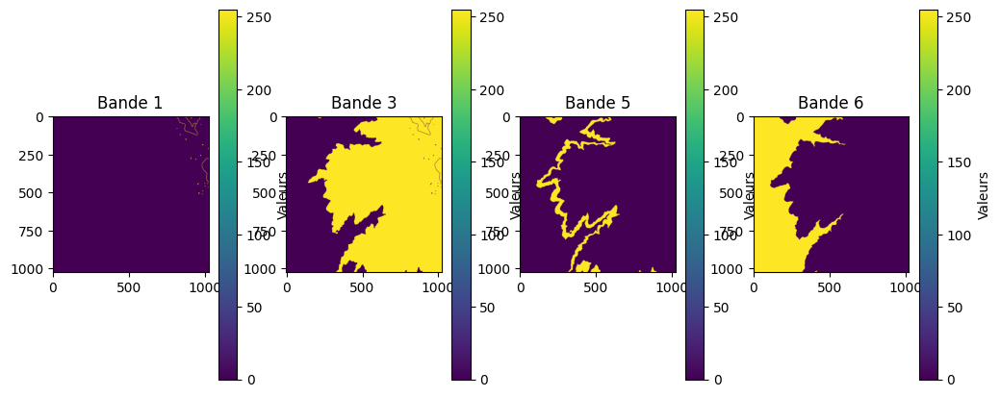

Métadonnées: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


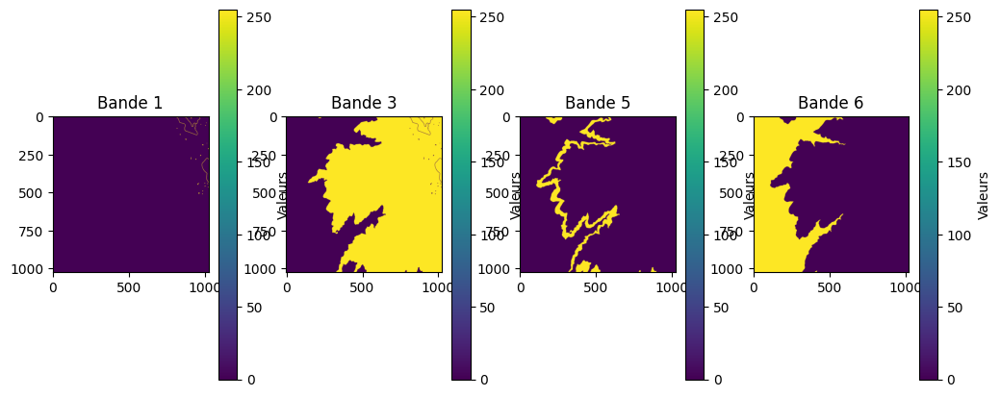

In [5]:
path = path_dataset + path_testdata
path_folder = path_dataset + "labels/labels/1311_3077_13_10N/Labels/Raster/10N-122W-40N-L3H-SR/"
for i in range(1, 13):
    num = str(i).zfill(2)
    path = path_folder + f"10N-122W-40N-L3H-SR-2018_{num}_01.tif"
    with rasterio.open(path) as dataset:
        print("Métadonnées:", dataset.meta)
        plt.subplots(1, 4, figsize=(12, 5))
        for i in range(1, n_band+1):
            if i in [1, 3, 5, 6]:
                band = dataset.read(i)
                plt.subplot(1, 4, [1,3,5,6].index(i)+1)
                plt.imshow(band)
                plt.colorbar(label='Valeurs')
                plt.title(f'Bande {i}')
            
        plt.show()

Band 1 - min: 0 max: 255
Band 3 - min: 0 max: 255
Band 5 - min: 0 max: 255


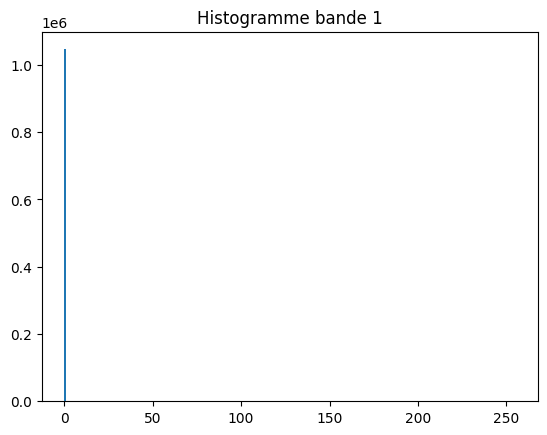

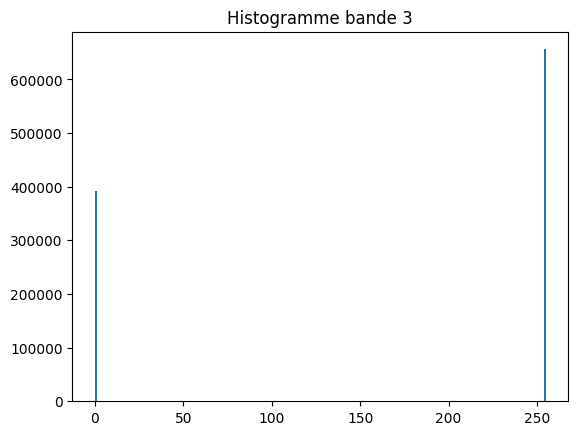

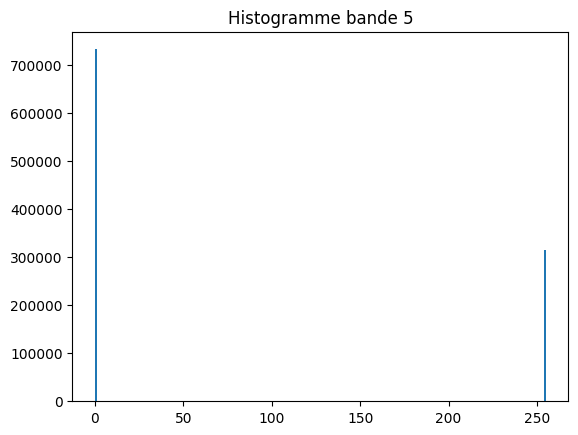

In [6]:

# Ouvrir le fichier raster
dataset = rasterio.open(path)

# Lire les bandes 1, 3 et 5
band1 = dataset.read(1)
band3 = dataset.read(3)
band5 = dataset.read(5)
band5 = dataset.read(6)

print('Band 1 - min:', band1.min(), 'max:', band1.max())
print('Band 3 - min:', band3.min(), 'max:', band3.max())
print('Band 5 - min:', band5.min(), 'max:', band5.max())


plt.hist(band1.flatten(), bins=256, range=(band1.min(), band1.max()))
plt.title('Histogramme bande 1')
plt.show()

plt.hist(band3.flatten(), bins=256, range=(band3.min(), band3.max()))
plt.title('Histogramme bande 3')
plt.show()

plt.hist(band5.flatten(), bins=256, range=(band5.min(), band5.max()))
plt.title('Histogramme bande 5')
plt.show()


#### Visualisation des Histogramme :

On voit que chaque images à des valeurs soit 0, soit 255. ce qui correspond à apartenir à la classe ou non. On remarque que certaines parties des images appartiennent à plusieurs classes à la fois.


# Visualisation des images satellites 

### Analyse des image dans PF-SR

#### Image RGB

In [7]:
path_img = "planet.10N/planet/10N/23E-188N/1311_3077_13/PF-SR/2018-01-01.tif"

Profile du dataset: {'driver': 'GTiff', 'dtype': 'int16', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 4, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'lzw', 'interleave': 'pixel'}
Métadonnées: {'driver': 'GTiff', 'dtype': 'int16', 'nodata': None, 'width': 1

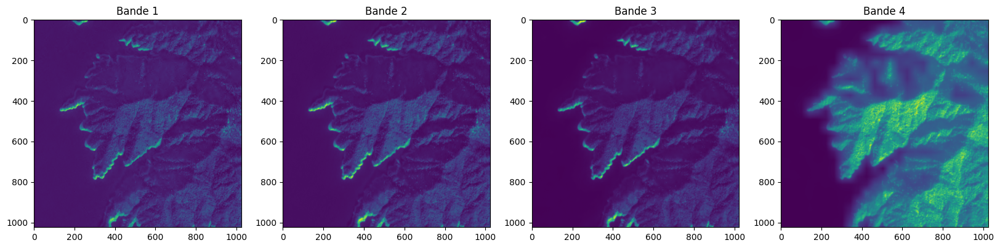

In [8]:
with rasterio.open(path_dataset+path_img) as dataset:
    n_band = dataset.count
    print("Profile du dataset:", dataset.profile)
    print("Métadonnées:", dataset.meta)
    print("Nombre de bandes:", n_band)
    plt.subplots(1, n_band, figsize=(20, 10))
    for i in range(1, n_band+1):
        band = dataset.read(i)
        plt.subplot(1, n_band, i)
        plt.imshow(band)
        plt.title(f'Bande {i}')
        
    plt.show()

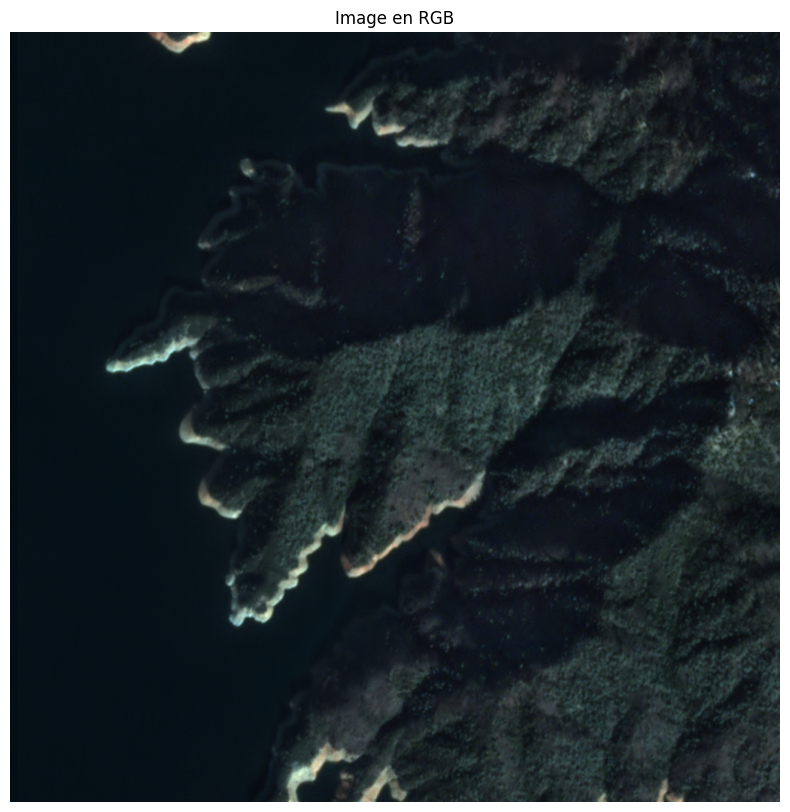

In [9]:

with rasterio.open(path_dataset+path_img) as src:
    
    red = src.read(3) 
    green = src.read(2) 
    blue = src.read(1)  

    red = red / red.max()
    green = green / green.max()
    blue = blue / blue.max()

    rgb_image = np.dstack((red, green, blue))

# image rgb normalisée
plt.figure(figsize=(10, 10))
plt.imshow(rgb_image)
plt.title("Image en RGB")
plt.axis("off")
plt.show()


In [10]:

project_root = Path.cwd().parent 
src_path = project_root / "src"
sys.path.append(str(src_path))


In [11]:
img = SatImageReader(path_dataset+path_img)

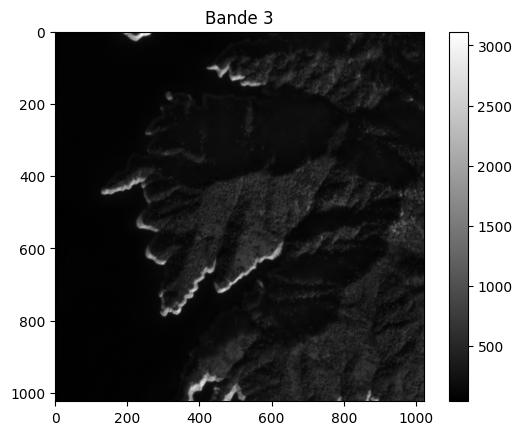

In [12]:
img.show_band(3)

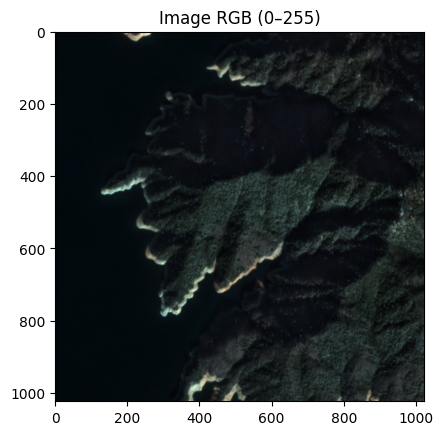

In [13]:
img.show_rgb()

#### Histogramme 

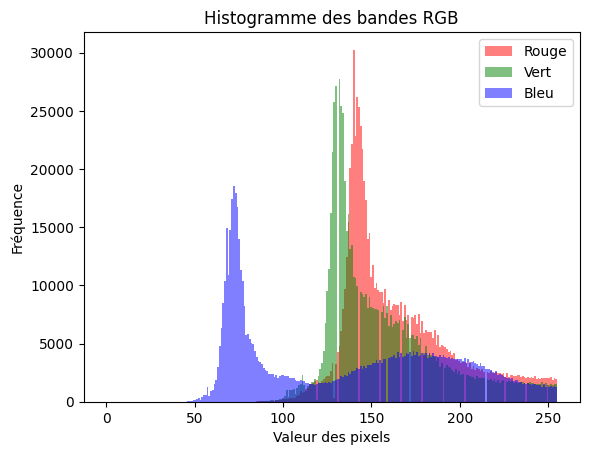

In [14]:
img.show_rgb_hist(bands_rgb = (1,2,3),show_infrared=False)

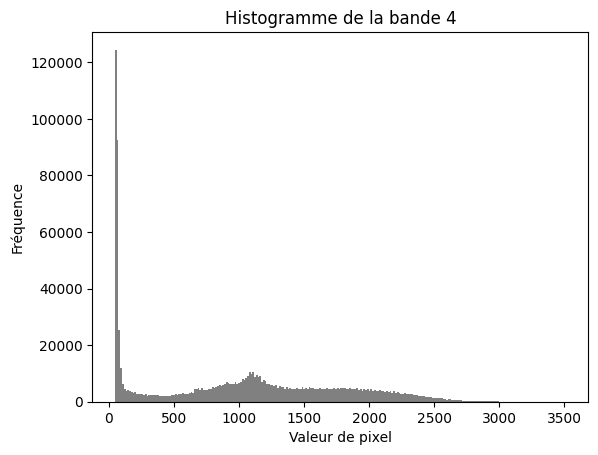

In [15]:
img.show_band_hist(4)

#### Calcul de l'indice de végétation par différence (NDVI)

Indice allant de -1 à 1 ?
* \< 0 : Eau, surfaces enneigées ou nuages.
* ~0 : Sols nus ou surfaces minérales.
* 0,2 à 0,5 : Végétation clairsemée ou stressée.
* \> 0,5 : Végétation dense et en bonne santé.

In [16]:
img.calculate_ndvi()

array([[0.12903225, 0.11111111, 0.10236221, ..., 0.72595155, 0.7616959 ,
        0.7383592 ],
       [0.1570248 , 0.12903225, 0.12      , ..., 0.71106696, 0.74696213,
        0.74596184],
       [0.136     , 0.11111111, 0.12      , ..., 0.74703556, 0.72797745,
        0.7195994 ],
       ...,
       [0.13559322, 0.1       , 0.07438017, ..., 0.49797845, 0.50068027,
        0.5168067 ],
       [0.1092437 , 0.07317073, 0.07317073, ..., 0.5070328 , 0.51236033,
        0.51589245],
       [0.06349207, 0.00763359, 0.06349207, ..., 0.4899966 , 0.49982634,
        0.50394267]], shape=(1024, 1024), dtype=float32)

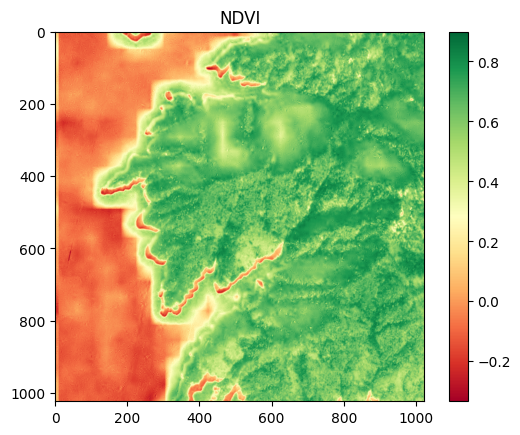

In [17]:
img.show_ndvi()

array([[  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       ...,
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255]],
      shape=(1024, 1024), dtype=uint8)

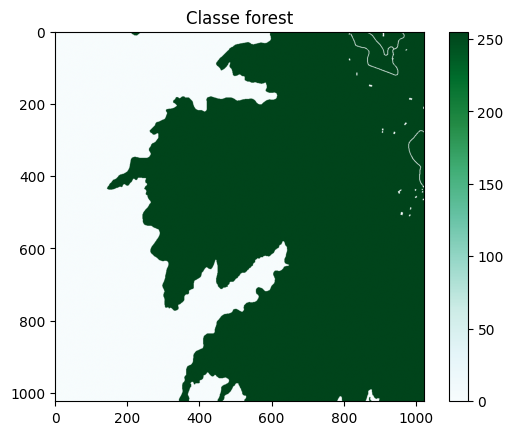

In [18]:
path_classes = path_dataset+path_label


classes = ClassesReader(path_classes)

classes.show_class(3)

array([[  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       ...,
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255]],
      shape=(1024, 1024), dtype=uint8)

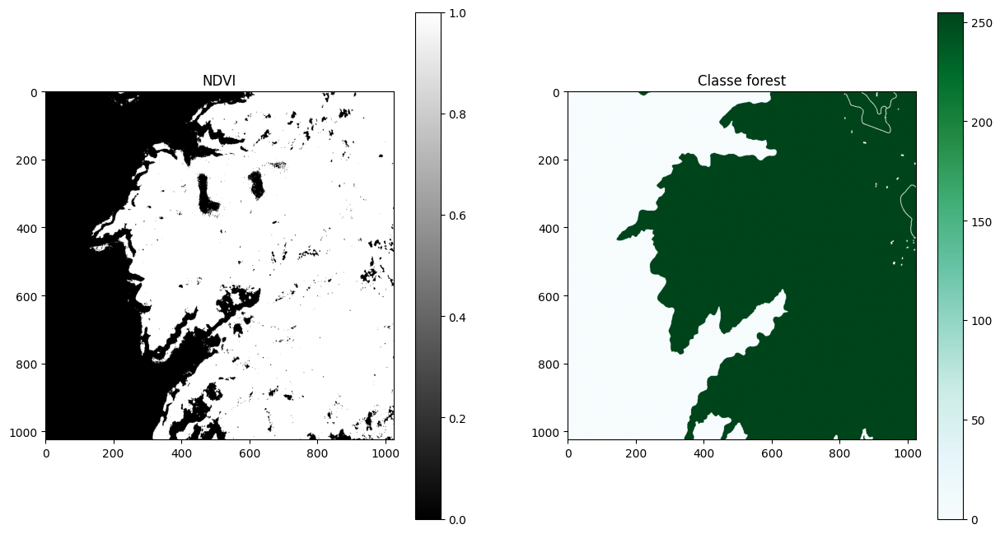

In [19]:
# TODO : change cmap pour show_class / Une cmap personnalisée pour chaque classe comme sur le papier DynamicEarthNet ? 

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
img.show_ndvi(threshold=0.5)
plt.subplot(1, 2, 2)
classes.show_class(3)

Avec un threshold sur le NDVI à 0.85, on retrouve presque le mask de Vegetations obtenu dans le jeu de test.

In [20]:

# TODO : Ajouter des méthodes pour les images raster
# TODO : Ajouter des méthodes pour les images vectorielles



### Compréhension de PF-QA

petite étude du dossier PF-QA

In [21]:
path_img_qa = path_dataset + "planet.10N/planet/10N/23E-188N/1311_3077_13/PF-QA/2018-01-01.tif"

In [22]:
img = SatImageReader(path_img_qa)

In [23]:
img.get_n_bands()

9

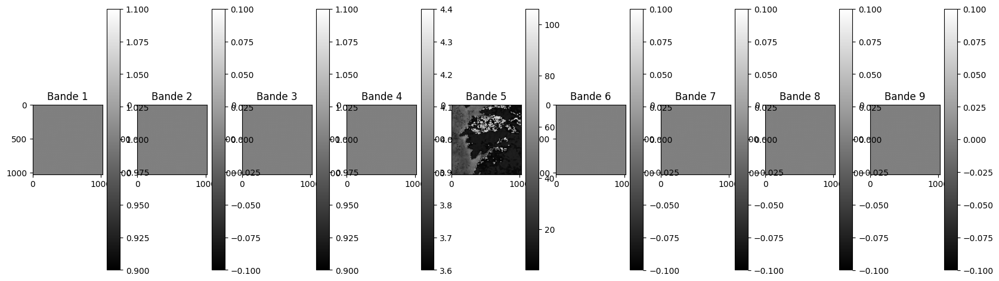

In [24]:
plt.subplots(1, 9, figsize=(20, 10))
for i in range(1, 10):
    plt.subplot(1, 9, i)
    img.show_band(i)
    plt.title(f'Bande {i}')

In [25]:
img.show_metadata()

{'driver': 'GTiff', 'dtype': 'int16', 'nodata': -1000.0, 'width': 1024, 'height': 1024, 'count': 9, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 10N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32610"]]'), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}


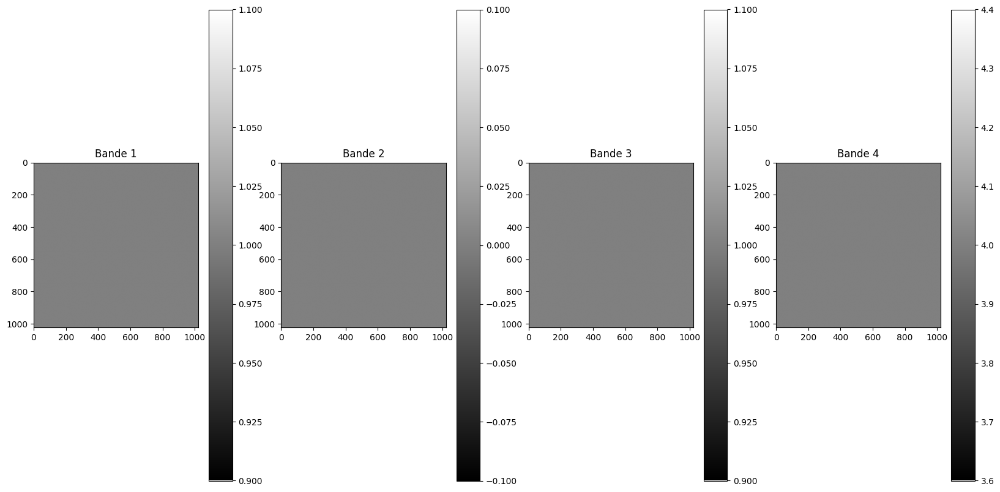

In [26]:
plt.subplots(1, 4, figsize=(20, 10))
for i in range(1, 5):
    plt.subplot(1, 4, i)
    img.show_band(i)
    plt.title(f'Bande {i}')

" The purpose of this is to denote which
parts of the data are raw observations and which parts are
gap-filled with temporally close observations. For every
pixel, the QA product gives the distance and direction to
the day of the observation. For example, a pixel value of -1
implies that the pixel has been filled from the previous day. "

--> Pourquoi nous ne sommes pas en présence d'un masque avec des pixels à 0, -1, +1 etc.. ? 

# Etude des classes avant/après

In [27]:
BASE_PATH = path_dataset + "labels/labels/1311_3077_13_10N/Labels/Raster/10N-122W-40N-L3H-SR/"
BEGIN = "10N-122W-40N-L3H-SR-2018_01_01.tif"
END = "10N-122W-40N-L3H-SR-2019_12_01.tif"

In [28]:
classes_begin = ClassesReader(BASE_PATH + BEGIN)
classes_end = ClassesReader(BASE_PATH + END)

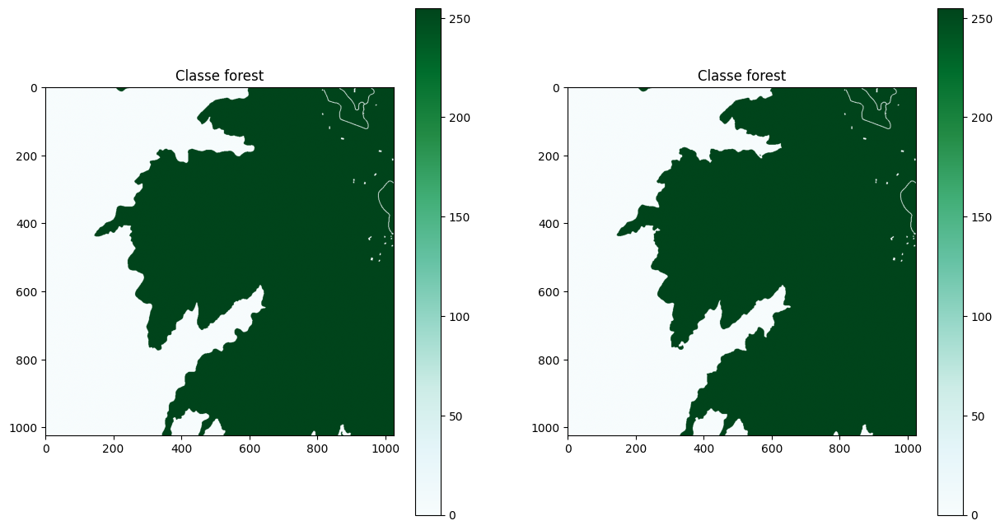

In [29]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
data_begin = classes_begin.show_class(3)
plt.subplot(1, 2, 2)
data_end = classes_end.show_class(3)

In [30]:
deforestation = data_begin- data_end

Text(0.5, 1.0, 'Classe Forest_and_Other_Vegetation/ 01/01/18 - 12/12/19')

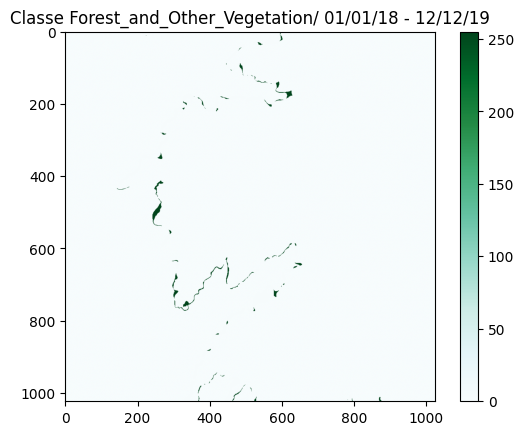

In [31]:
plt.imshow(deforestation, cmap="BuGn")
plt.colorbar()
plt.title(f"Classe Forest_and_Other_Vegetation/ 01/01/18 - 12/12/19")

In [32]:
IMAGE_BEGIN = path_dataset+"planet.10N/planet/10N/23E-188N/1311_3077_13/PF-SR/2018-01-01.tif"
image_begin = SatImageReader(IMAGE_BEGIN)

IMAGE_END = path_dataset+"planet.10N/planet/10N/23E-188N/1311_3077_13/PF-SR/2019-12-31.tif"
image_end = SatImageReader(IMAGE_END)


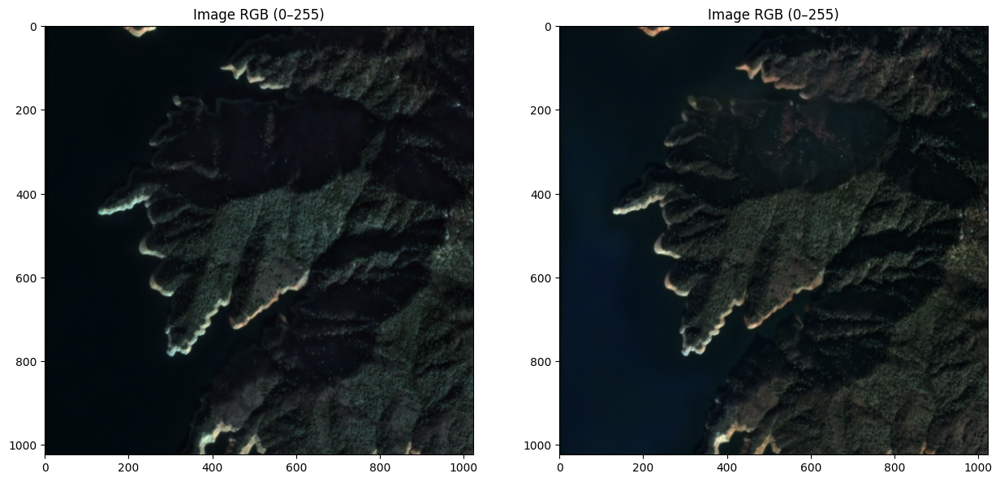

In [33]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
image_begin.show_rgb()
plt.subplot(1, 2, 2)
image_end.show_rgb()

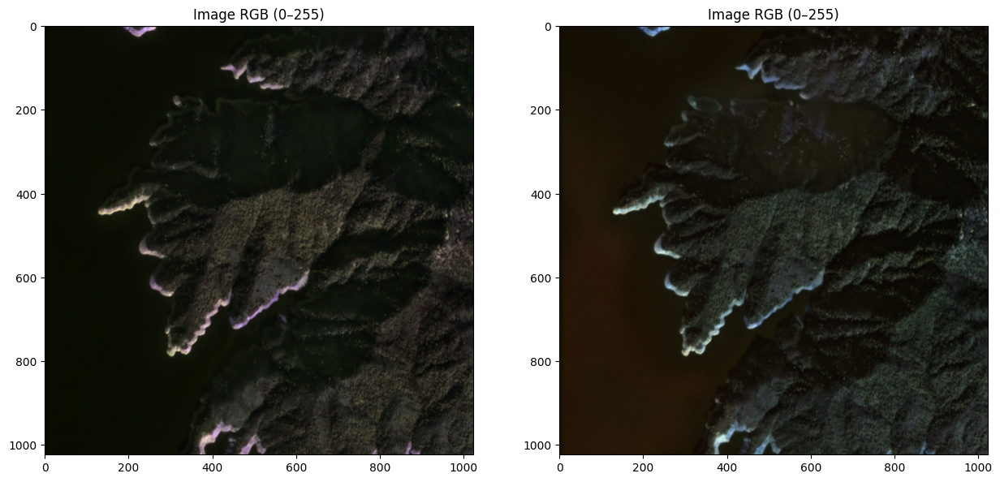

In [34]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
image_begin.show_rgb((2,1,3))
plt.subplot(1, 2, 2)
image_end.show_rgb((1,2,3))

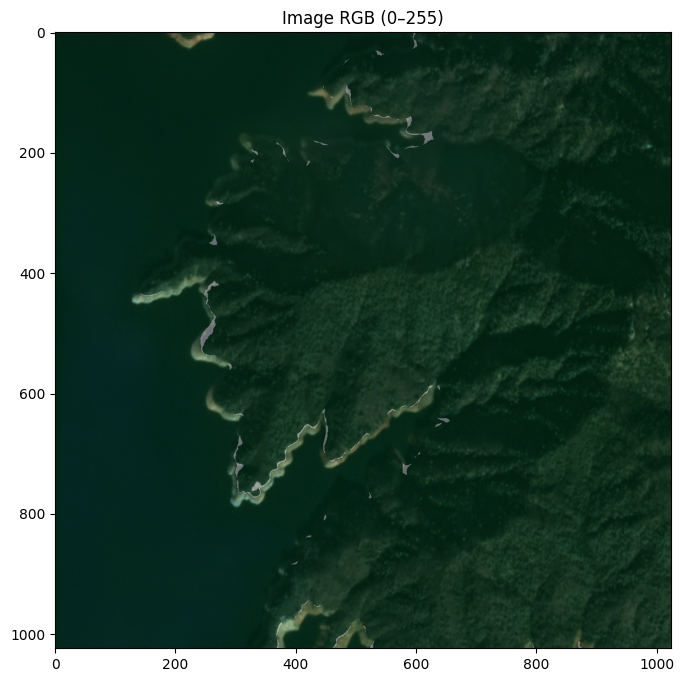

In [35]:
# supperposition de image_end et du masque de deforestation
plt.figure(figsize=(15, 8))
image_end.show_rgb()
plt.imshow(255-deforestation, cmap="BuGn", alpha=0.4)
plt.show()

In [36]:


ClassesReader(BASE_PATH+END).detect_classes()

[1, 3, 5, 6]

array([[  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       ...,
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255]],
      shape=(1024, 1024), dtype=uint8)

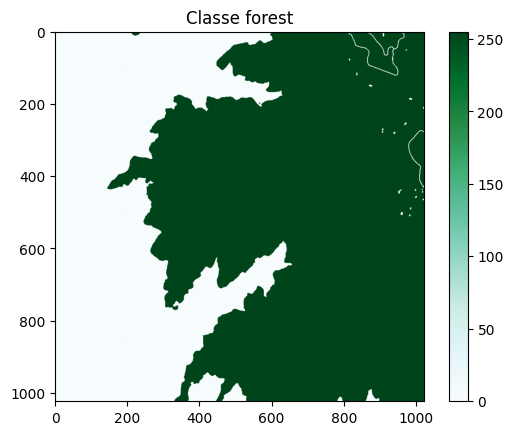

In [37]:
classes_end.show_class(3)

[array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], shape=(1024, 1024), dtype=uint8),
 array([[  0,   0,   0, ..., 255, 255, 255],
        [  0,   0,   0, ..., 255, 255, 255],
        [  0,   0,   0, ..., 255, 255, 255],
        ...,
        [  0,   0,   0, ..., 255, 255, 255],
        [  0,   0,   0, ..., 255, 255, 255],
        [  0,   0,   0, ..., 255, 255, 255]],
       shape=(1024, 1024), dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], shape=(1024, 1024), dtype=uint8),
 array([[255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0],
        ...,
        [255, 255, 255, ...,   0,  

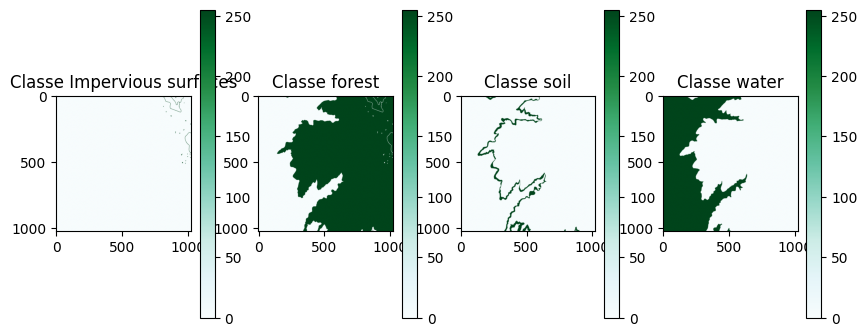

In [38]:
plt.figure(figsize=(10, 4))
classes_begin.show_class_list()

[array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], shape=(1024, 1024), dtype=uint8),
 array([[  0,   0,   0, ..., 255, 255, 255],
        [  0,   0,   0, ..., 255, 255, 255],
        [  0,   0,   0, ..., 255, 255, 255],
        ...,
        [  0,   0,   0, ..., 255, 255, 255],
        [  0,   0,   0, ..., 255, 255, 255],
        [  0,   0,   0, ..., 255, 255, 255]],
       shape=(1024, 1024), dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], shape=(1024, 1024), dtype=uint8),
 array([[255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0],
        ...,
        [255, 255, 255, ...,   0,  

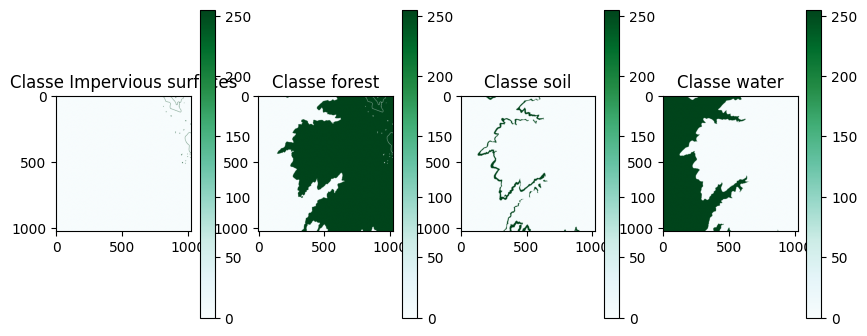

In [39]:
plt.figure(figsize=(10, 4))
classes_end.show_class_list()

# Etude des meta-datas

In [40]:
# TODO : Tester Convnext avec tête U-net 
# TODO : Analyse et compréhension des métadonnées, à quoi correspondent-elles ?
# TODO : Verifier l'alignement des images
# TODO : Pourquoi certians classes ont plusieurs valeurs 

In [43]:
import segmentation_models_pytorch as smp
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import transforms
from PIL import Image


# Chargement du modèle avec ConvNeXt comme backbone
model = smp.Unet(
    encoder_name="timm-efficientnet-b0",  # Ou 'timm-efficientnet-b0'
    encoder_weights="imagenet",
    in_channels=3,
    classes=7
)

In [44]:
import torch

IMAGE_BEGIN = path_dataset+"planet.10N/planet/10N/23E-188N/1311_3077_13/PF-SR/2018-01-01.tif"
image_begin = SatImageReader(IMAGE_BEGIN)

IMAGE_END = path_dataset+"planet.10N/planet/10N/23E-188N/1311_3077_13/PF-SR/2019-12-31.tif"
image_end = SatImageReader(IMAGE_END)

image_reader = SatImageReader(IMAGE_BEGIN)

# Sélectionner uniquement les bandes RGB (1,2,3)
image_np = np.stack([image_reader.image.read(i) for i in (1, 2, 3)], axis=0)  # (3, H, W)

# Normaliser entre 0 et 1
image_np = image_np.astype(np.float32)
image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())

# Convertir en torch.Tensor
image_tensor = torch.from_numpy(image_np)  # (3, H, W)

# Ajouter une dimension batch
image_tensor = image_tensor.unsqueeze(0)  # (1, 3, H, W)

# Vérifier la forme
print("Tenseur image :", image_tensor.shape)  # Doit être (1, 3, H, W)

# Passer dans le modèle
with torch.no_grad():
    output = model(image_tensor)

print("Output shape:", output.shape)


Tenseur image : torch.Size([1, 3, 1024, 1024])
Output shape: torch.Size([1, 7, 1024, 1024])


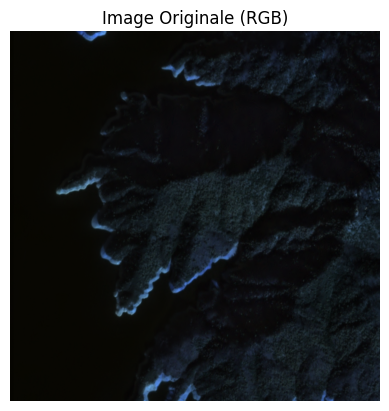

TypeError: Invalid shape (7, 1024, 1024) for image data

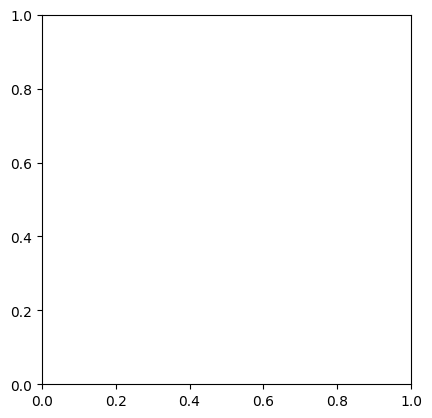

In [45]:
image_np = image_tensor.squeeze(0).numpy()  # (3, H, W)

# Transposer pour obtenir un format (H, W, 3) pour Matplotlib
image_np = np.transpose(image_np, (1, 2, 0))

# Affichage
plt.imshow(image_np)
plt.title("Image Originale (RGB)")
plt.axis("off")
plt.show()

# Convertir la sortie en numpy
output_np = output.squeeze().cpu().numpy()  # (H, W)

# Affichage
plt.imshow(output_np, cmap="gray")  # ou cmap="jet" pour une colormap colorée
plt.colorbar()
plt.title("Carte de segmentation")
plt.axis("off")
plt.show()

In [46]:
output.shape

torch.Size([1, 7, 1024, 1024])

TypeError: Invalid shape (7, 1024, 1024) for image data

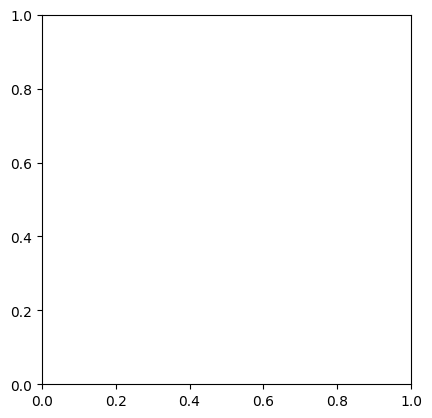

In [47]:
output = torch.sigmoid(output)  # Transforme les logits en probas [0, 1]
threshold = 0.5  # Seuil de segmentation
pred_mask = (output > threshold).float()  # Convertit en 0 ou 1

plt.imshow(pred_mask.squeeze().cpu().numpy(), cmap="gray")  # Image en noir et blanc
plt.title("Masque de segmentation")
plt.axis("off")
plt.show()

image_np = image_tensor.squeeze().permute(1, 2, 0).cpu().numpy()  # Convertir en format image
mask_np = pred_mask.squeeze().cpu().numpy()  # Convertir en numpy

plt.imshow(image_np)  # Image originale
plt.imshow(mask_np, cmap="jet", alpha=0.3)  # Superposition du masque en couleur
plt.axis("off")
plt.show()

Unet(
  (encoder): MixVisionTransformerEncoder(
    (patch_embed1): OverlapPatchEmbed(
      (proj): Conv2d(3, 32, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
      (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed2): OverlapPatchEmbed(
      (proj): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed3): OverlapPatchEmbed(
      (proj): Conv2d(64, 160, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((160,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed4): OverlapPatchEmbed(
      (proj): Conv2d(160, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
    )
    (block1): Sequential(
      (0): Block(
        (norm1): LayerNorm((32,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (q): Linear(in_features=32, o

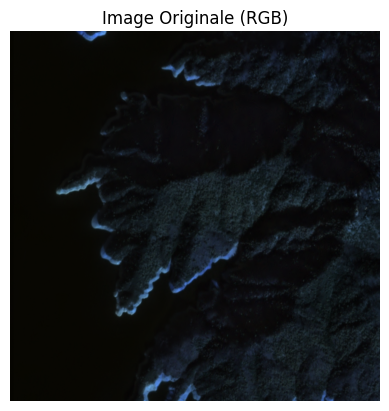

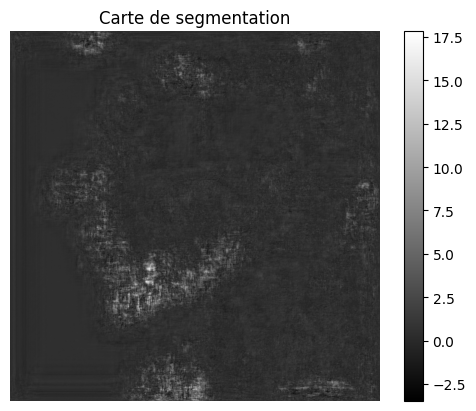

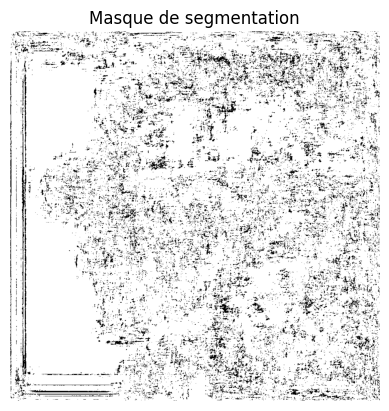

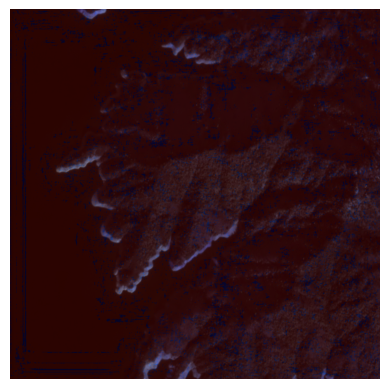

In [48]:
import segmentation_models_pytorch as smp

# Chargement du modèle avec ConvNeXt comme backbone
model = smp.Unet(
    encoder_name="mit_b0",  # Ou 'timm-efficientnet-b0'
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
)

# Vérification du modèle
print(model)

IMAGE_BEGIN = path_dataset+"planet.10N/planet/10N/23E-188N/1311_3077_13/PF-SR/2018-01-01.tif"
image_begin = SatImageReader(IMAGE_BEGIN)

IMAGE_END = path_dataset+"planet.10N/planet/10N/23E-188N/1311_3077_13/PF-SR/2019-12-31.tif"
image_end = SatImageReader(IMAGE_END)

image_reader = SatImageReader(IMAGE_BEGIN)

# Sélectionner uniquement les bandes RGB (1,2,3)
image_np = np.stack([image_reader.image.read(i) for i in (1, 2, 3)], axis=0)  # (3, H, W)

# Normaliser entre 0 et 1
image_np = image_np.astype(np.float32)
image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())

# Convertir en torch.Tensor
image_tensor = torch.from_numpy(image_np)  # (3, H, W)

# Ajouter une dimension batch
image_tensor = image_tensor.unsqueeze(0)  # (1, 3, H, W)

# Vérifier la forme
print("Tenseur image :", image_tensor.shape)  # Doit être (1, 3, H, W)

# Passer dans le modèle
with torch.no_grad():
    output = model(image_tensor)

print("Output shape:", output.shape)

image_np = image_tensor.squeeze(0).numpy()  # (3, H, W)

# Transposer pour obtenir un format (H, W, 3) pour Matplotlib
image_np = np.transpose(image_np, (1, 2, 0))

# Affichage
plt.imshow(image_np)
plt.title("Image Originale (RGB)")
plt.axis("off")
plt.show()

# Convertir la sortie en numpy
output_np = output.squeeze().cpu().numpy()  # (H, W)

# Affichage
plt.imshow(output_np, cmap="gray")  # ou cmap="jet" pour une colormap colorée
plt.colorbar()
plt.title("Carte de segmentation")
plt.axis("off")
plt.show()

output = torch.sigmoid(output)  # Transforme les logits en probas [0, 1]
threshold = 0.5  # Seuil de segmentation
pred_mask = (output > threshold).float()  # Convertit en 0 ou 1

plt.imshow(pred_mask.squeeze().cpu().numpy(), cmap="gray")  # Image en noir et blanc
plt.title("Masque de segmentation")
plt.axis("off")
plt.show()

image_np = image_tensor.squeeze().permute(1, 2, 0).cpu().numpy()  # Convertir en format image
mask_np = pred_mask.squeeze().cpu().numpy()  # Convertir en numpy

plt.imshow(image_np)  # Image originale
plt.imshow(mask_np, cmap="jet", alpha=0.3)  # Superposition du masque en couleur
plt.axis("off")
plt.show()

In [3]:
df_merged = pd.read_csv("df_merged.csv")
df_merged.head()

,label,key,train_test,labels_path,planet_path,country,continent
0,4397_4302_13_33S,4397_4302_13,train,../../../../tsi/data_education/fil_rouge_Airbu...,../../../../tsi/data_education/fil_rouge_Airbu...,Angola,Africa
1,2415_3082_13_18N,2415_3082_13,train,../../../../tsi/data_education/fil_rouge_Airbu...,../../../../tsi/data_education/fil_rouge_Airbu...,United States of America,North America
2,2832_4366_13_21S,2832_4366_13,train,../../../../tsi/data_education/fil_rouge_Airbu...,../../../../tsi/data_education/fil_rouge_Airbu...,Brazil,South America
3,4838_3506_13_36N,4838_3506_13,train,../../../../tsi/data_education/fil_rouge_Airbu...,../../../../tsi/data_education/fil_rouge_Airbu...,Egypt,Africa
4,6752_3115_13_50N,6752_3115_13,train,../../../../tsi/data_education/fil_rouge_Airbu...,../../../../tsi/data_education/fil_rouge_Airbu...,China,Asia


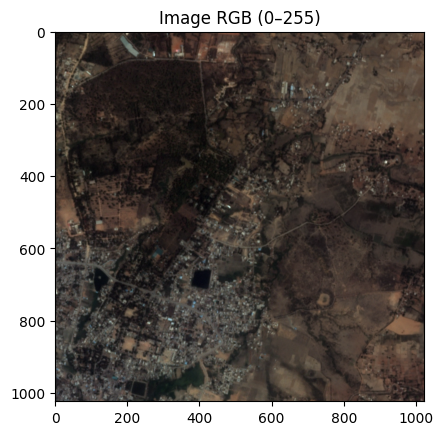

In [50]:
img = SatImageReader(df_merged["planet_path"].iloc[6]+"/2018-05-01.tif")
img.show_rgb()

../../../../tsi/data_education/fil_rouge_Airbus_2025/dynamic_earth_net/planet.44N/planet/44N/30E-106N/5989_3554_13/PF-SR/2018-11-03.tif
../../../../tsi/data_education/fil_rouge_Airbus_2025/dynamic_earth_net/planet.30N/planet/30N/27E-30N/4062_3943_13/PF-SR/2018-11-03.tif


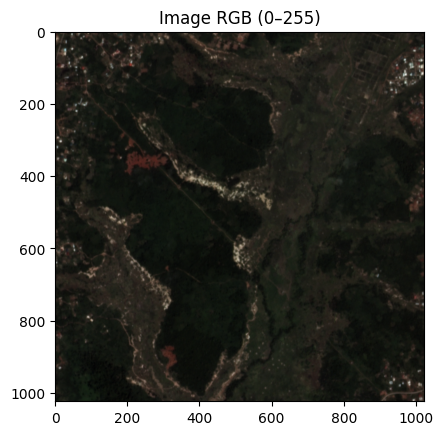

In [51]:
img = SatImageReader(df_merged["planet_path"].iloc[6]+"/2018-11-03.tif")
print(df_merged["planet_path"].iloc[6]+"/2018-11-03.tif")
print("../../../../tsi/data_education/fil_rouge_Airbus_2025/dynamic_earth_net/planet.30N/planet/30N/27E-30N/4062_3943_13/PF-SR/2018-11-03.tif")
img = SatImageReader("../../../../tsi/data_education/fil_rouge_Airbus_2025/dynamic_earth_net/planet.30N/planet/30N/27E-30N/4062_3943_13/PF-SR/2018-11-03.tif")
img.show_rgb()

In [52]:
df_merged.head()

,label,key,train_test,labels_path,planet_path,country,continent
0,4397_4302_13_33S,4397_4302_13,train,../../../../tsi/data_education/fil_rouge_Airbu...,../../../../tsi/data_education/fil_rouge_Airbu...,Angola,Africa
1,2415_3082_13_18N,2415_3082_13,train,../../../../tsi/data_education/fil_rouge_Airbu...,../../../../tsi/data_education/fil_rouge_Airbu...,United States of America,North America
2,2832_4366_13_21S,2832_4366_13,train,../../../../tsi/data_education/fil_rouge_Airbu...,../../../../tsi/data_education/fil_rouge_Airbu...,Brazil,South America
3,4838_3506_13_36N,4838_3506_13,train,../../../../tsi/data_education/fil_rouge_Airbu...,../../../../tsi/data_education/fil_rouge_Airbu...,Egypt,Africa
4,6752_3115_13_50N,6752_3115_13,train,../../../../tsi/data_education/fil_rouge_Airbu...,../../../../tsi/data_education/fil_rouge_Airbu...,China,Asia


In [53]:
print(df_merged["labels_path"].iloc[0])
print(df_merged["planet_path"].iloc[0])
clean_path = df_merged["labels_path"].iloc[0].rstrip("/")
label_filename  = clean_path.split("/")[-1]
print(label_filename)

../../../../tsi/data_education/fil_rouge_Airbus_2025/dynamic_earth_net/labels/labels/4397_4302_13_33S/Labels/Raster/33S-13E-9S-L3H-SR/
../../../../tsi/data_education/fil_rouge_Airbus_2025/dynamic_earth_net/planet.33S/planet/33S/12E-375N/4397_4302_13/PF-SR
33S-13E-9S-L3H-SR


In [21]:
from datetime import datetime, timedelta
from PIL import Image
import calendar
import os
import torch
from torch.utils.data import DataLoader
import torchvision.transforms as transforms


class CustomDataset():
    def __init__(self, df, start_date, end_date, transform=None):
        self.df = df
        self.start_date = datetime.strptime(start_date, "%Y-%m-%d")
        self.end_date = datetime.strptime(end_date, "%Y-%m-%d")
        self.transform = transform

        # Créer une liste de dates à partir de la période spécifiée
        self.dates = self._generate_dates()

    def _generate_dates(self):
        dates = []
        current_date = self.start_date

        # Ajouter la première date (start_date) directement
        dates.append(current_date.strftime("%Y-%m-%d"))

        # Passer au mois suivant pour les dates suivantes
        current_date = current_date.replace(day=1)  # Passer au premier jour du mois suivant

        while current_date <= self.end_date:
            dates.append(current_date.strftime("%Y-%m-%d"))
            
            # Passer au mois suivant
            if current_date.month == 12:
                current_date = current_date.replace(year=current_date.year + 1, month=1, day=1)
            else:
                current_date = current_date.replace(month=current_date.month + 1, day=1)

        return dates

    def __len__(self):
        return len(self.dates) * len(self.df)  # Nombre d'images pour chaque date

    def __getitem__(self, idx):
        # Identifier la ligne du DataFrame et la date
        row_idx = idx // len(self.dates)  # Identifier la ligne du DataFrame
        date_idx = idx % len(self.dates)  # Identifier la date à partir de la liste des dates
        date_str = self.dates[date_idx]

        # Récupérer les chemins des images et des labels
        planet_path = self.df["planet_path"].iloc[row_idx]
        labels_path = self.df["labels_path"].iloc[row_idx]
        clean_label_path = labels_path.rstrip("/")
        label_filename  = clean_label_path.split("/")[-1]
        
        # Générer le chemin complet de l'image et des labels pour cette date
        # image_path = os.path.join(planet_path, f"{date_str}.tif")
        # label_path = os.path.join(labels_path, f"{label_filename}-{date_str.replace('-', '_')}.tif")

        # Générer les chemins avec les deux formats de date
        image_path_hyphen = os.path.join(planet_path, f"{date_str}.tif")
        image_path_underscore = os.path.join(planet_path, f"{date_str.replace('-', '_')}.tif")

        label_path_hyphen = os.path.join(labels_path, f"{label_filename}-{date_str}.tif")
        label_path_underscore = os.path.join(labels_path, f"{label_filename}-{date_str.replace('-', '_')}.tif")

        # Vérifier l'existence et choisir le bon chemin
        image_path = image_path_hyphen if os.path.exists(image_path_hyphen) else image_path_underscore
        label_path = label_path_hyphen if os.path.exists(label_path_hyphen) else label_path_underscore

        with rasterio.open(image_path) as src:
            image = src.read().astype("float32")  # [C, H, W]

        with rasterio.open(label_path) as src:
            label = src.read().astype("float32")  # [C, H, W]

        image = image[:3]  # Garder uniquement les 3 premières bandes

        image = np.transpose(image, (1, 2, 0))  # Changer de [C, H, W] à [H, W, C]
        label = np.transpose(label, (1, 2, 0))  # Changer de [C, H, W] à [H, W, C]

        # Appliquer les transformations après conversion en ndarray
        if self.transform:
            image = self.transform(image)
            label = self.transform(label)

        # Convertir en tensor après transformation
        image = torch.tensor(image).permute(2, 0, 1)  # [H, W, C] à [C, H, W]
        label = torch.tensor(label).permute(2, 0, 1)  # [H, W, C] à [C, H, W]

        return image, label

start_date = "2018-05-01"
end_date = "2019-12-31"
dataset = CustomDataset(df_merged, start_date, end_date)

print("Nombre d'images:", len(dataset))

dataloader = DataLoader(dataset, batch_size=2, shuffle=True)

images, labels = next(iter(dataloader))

Nombre d'images: 1449


In [22]:
print(dataloader)

# images = images.permute(0, 2, 1, 3)
# labels = labels.permute(0, 2, 1, 3)

print(images.shape)  # [batch_size, C, H, W]
print(labels.shape)  # [batch_size, C, H, W]

torch.Size([2, 3, 1024, 1024])
torch.Size([2, 7, 1024, 1024])


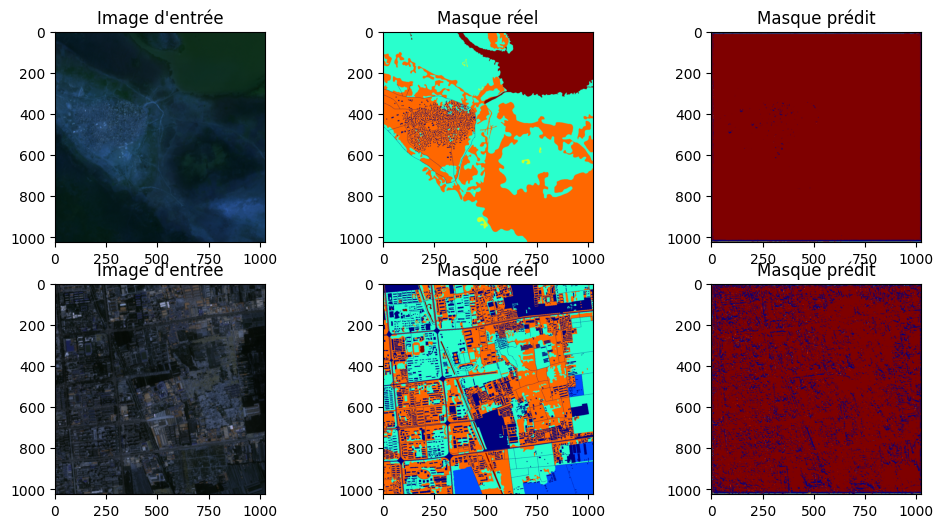

In [23]:
import segmentation_models_pytorch as smp

# Charger un modèle U-Net pré-entraîné avec un backbone ResNet34
model = smp.Unet(
    encoder_name="resnet34",  # Backbone pré-entraîné
    encoder_weights="imagenet",  # Charger les poids ImageNet
    in_channels=3,  # 3 canaux pour une image RGB
    classes=7,  # Nombre de classes pour la segmentation (7 dans ton cas)
    decoder_use_bacthnorm=True,
    decoder_dropout=0.3
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()  # Mode évaluation

# Récupérer un batch du dataloader
images, masks = next(iter(dataloader))
images = images.to(device)

# Prédiction
with torch.no_grad():
    outputs = model(images)
    predicted_masks = torch.argmax(outputs, dim=1).cpu()  # (B, H, W)

# Visualisation de la première image et son masque prédit
plt.figure(figsize=(12, 6))


image = images[0].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())

image = image.transpose(1, 2, 0)

plt.subplot(2, 3, 1)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[0].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 2)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 3)
plt.imshow(predicted_masks[0], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.subplot(2, 3, 4)
image = images[1].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())
image = image.transpose(1, 2, 0)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[1].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 5)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 6)
plt.imshow(predicted_masks[1], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.show()

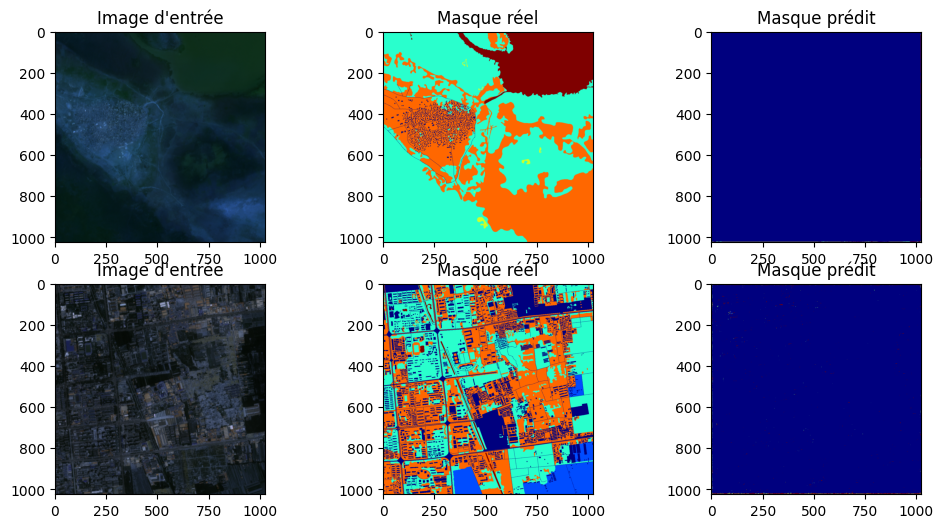

In [24]:
import segmentation_models_pytorch as smp

# Charger un modèle U-Net pré-entraîné avec un backbone ResNet34
model = smp.Unet(
    encoder_name="efficientnet-b0",  # Backbone pré-entraîné
    encoder_weights="imagenet",  # Charger les poids ImageNet
    in_channels=3,  # 3 canaux pour une image RGB
    classes=7,  # Nombre de classes pour la segmentation (7 dans ton cas)
    decoder_use_bacthnorm=True,
    decoder_dropout=0.3
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()  # Mode évaluation

# Récupérer un batch du dataloader
# images, masks = next(iter(dataloader))
images = images.to(device)

# Prédiction
with torch.no_grad():
    outputs = model(images)
    predicted_masks = torch.argmax(outputs, dim=1).cpu()  # (B, H, W)

# Visualisation de la première image et son masque prédit
plt.figure(figsize=(12, 6))


image = images[0].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())

image = image.transpose(1, 2, 0)

plt.subplot(2, 3, 1)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[0].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 2)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 3)
plt.imshow(predicted_masks[0], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.subplot(2, 3, 4)
image = images[1].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())
image = image.transpose(1, 2, 0)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[1].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 5)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 6)
plt.imshow(predicted_masks[1], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.show()

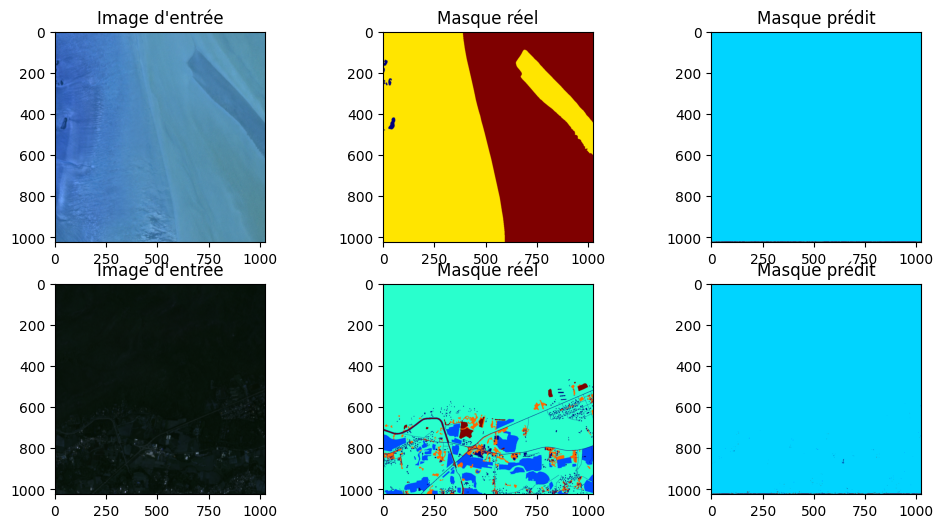

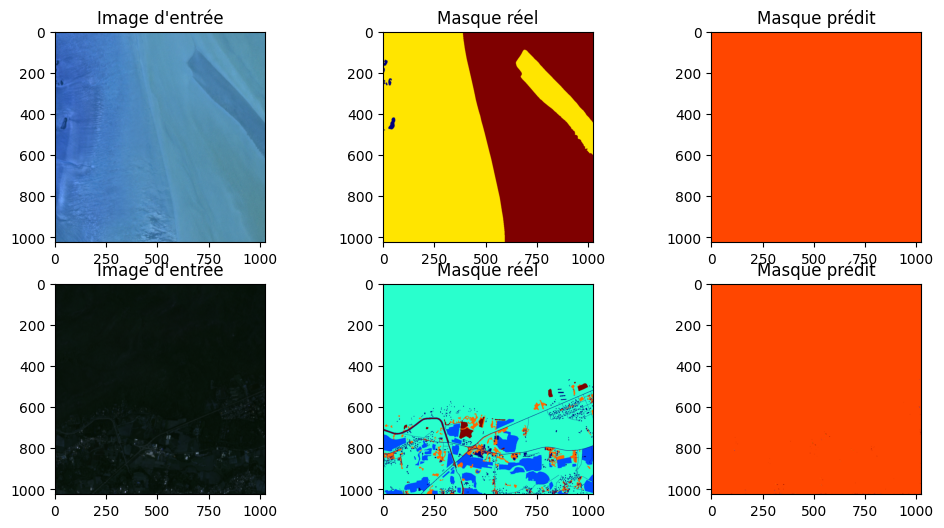

In [25]:
import segmentation_models_pytorch as smp

# Charger un modèle U-Net pré-entraîné avec un backbone ResNet34
model = smp.Unet(
    encoder_name="resnet34",  # Backbone pré-entraîné
    encoder_weights="imagenet",  # Charger les poids ImageNet
    in_channels=3,  # 3 canaux pour une image RGB
    classes=7,  # Nombre de classes pour la segmentation (7 dans ton cas)
    decoder_use_bacthnorm=True,
    decoder_dropout=0.3
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()  # Mode évaluation

# Récupérer un batch du dataloader
images, masks = next(iter(dataloader))
images = images.to(device)

# Prédiction
with torch.no_grad():
    outputs = model(images)
    predicted_masks = torch.argmax(outputs, dim=1).cpu()  # (B, H, W)

# Visualisation de la première image et son masque prédit
plt.figure(figsize=(12, 6))


image = images[0].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())

image = image.transpose(1, 2, 0)

plt.subplot(2, 3, 1)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[0].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 2)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 3)
plt.imshow(predicted_masks[0], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.subplot(2, 3, 4)
image = images[1].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())
image = image.transpose(1, 2, 0)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[1].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 5)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 6)
plt.imshow(predicted_masks[1], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.show()

import segmentation_models_pytorch as smp

# Charger un modèle U-Net pré-entraîné avec un backbone ResNet34
model = smp.Unet(
    encoder_name="efficientnet-b0",  # Backbone pré-entraîné
    encoder_weights="imagenet",  # Charger les poids ImageNet
    in_channels=3,  # 3 canaux pour une image RGB
    classes=7,  # Nombre de classes pour la segmentation (7 dans ton cas)
    decoder_use_bacthnorm=True,
    decoder_dropout=0.3
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()  # Mode évaluation

# Récupérer un batch du dataloader
# images, masks = next(iter(dataloader))
images = images.to(device)

# Prédiction
with torch.no_grad():
    outputs = model(images)
    predicted_masks = torch.argmax(outputs, dim=1).cpu()  # (B, H, W)

# Visualisation de la première image et son masque prédit
plt.figure(figsize=(12, 6))


image = images[0].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())

image = image.transpose(1, 2, 0)

plt.subplot(2, 3, 1)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[0].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 2)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 3)
plt.imshow(predicted_masks[0], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.subplot(2, 3, 4)
image = images[1].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())
image = image.transpose(1, 2, 0)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[1].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 5)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 6)
plt.imshow(predicted_masks[1], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.show()

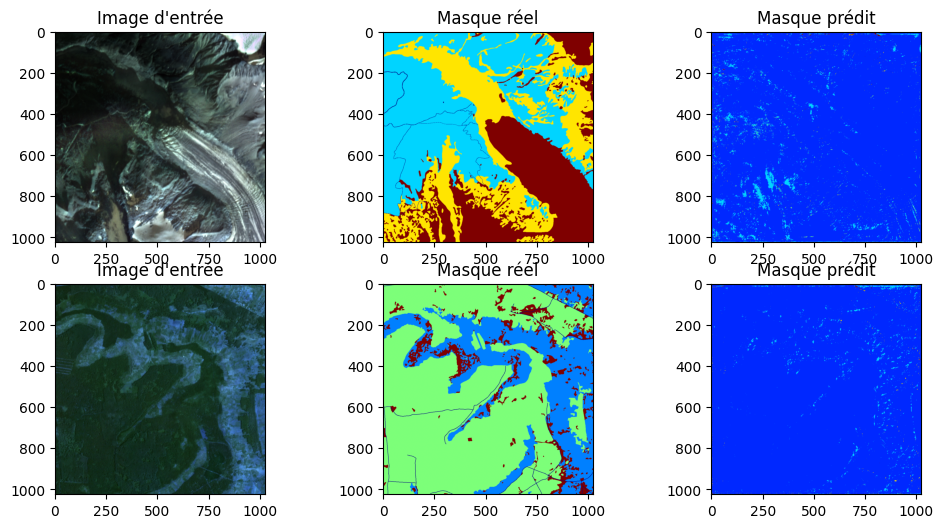

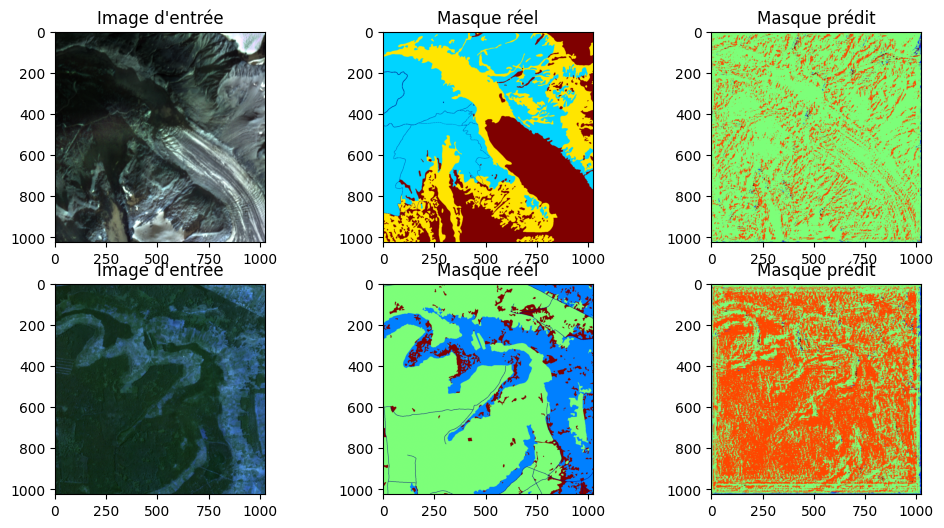

In [26]:
import segmentation_models_pytorch as smp

# Charger un modèle U-Net pré-entraîné avec un backbone ResNet34
model = smp.Unet(
    encoder_name="resnet34",  # Backbone pré-entraîné
    encoder_weights="imagenet",  # Charger les poids ImageNet
    in_channels=3,  # 3 canaux pour une image RGB
    classes=7,  # Nombre de classes pour la segmentation (7 dans ton cas)
    decoder_use_bacthnorm=True,
    decoder_dropout=0.3
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()  # Mode évaluation

# Récupérer un batch du dataloader
images, masks = next(iter(dataloader))
images = images.to(device)

# Prédiction
with torch.no_grad():
    outputs = model(images)
    predicted_masks = torch.argmax(outputs, dim=1).cpu()  # (B, H, W)

# Visualisation de la première image et son masque prédit
plt.figure(figsize=(12, 6))


image = images[0].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())

image = image.transpose(1, 2, 0)

plt.subplot(2, 3, 1)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[0].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 2)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 3)
plt.imshow(predicted_masks[0], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.subplot(2, 3, 4)
image = images[1].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())
image = image.transpose(1, 2, 0)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[1].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 5)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 6)
plt.imshow(predicted_masks[1], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.show()

import segmentation_models_pytorch as smp

# Charger un modèle U-Net pré-entraîné avec un backbone ResNet34
model = smp.Unet(
    encoder_name="efficientnet-b0",  # Backbone pré-entraîné
    encoder_weights="imagenet",  # Charger les poids ImageNet
    in_channels=3,  # 3 canaux pour une image RGB
    classes=7,  # Nombre de classes pour la segmentation (7 dans ton cas)
    decoder_use_bacthnorm=True,
    decoder_dropout=0.3
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()  # Mode évaluation

# Récupérer un batch du dataloader
# images, masks = next(iter(dataloader))
images = images.to(device)

# Prédiction
with torch.no_grad():
    outputs = model(images)
    predicted_masks = torch.argmax(outputs, dim=1).cpu()  # (B, H, W)

# Visualisation de la première image et son masque prédit
plt.figure(figsize=(12, 6))


image = images[0].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())

image = image.transpose(1, 2, 0)

plt.subplot(2, 3, 1)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[0].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 2)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 3)
plt.imshow(predicted_masks[0], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.subplot(2, 3, 4)
image = images[1].cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())
image = image.transpose(1, 2, 0)
plt.imshow(image)
plt.title("Image d'entrée")

real_mask = masks[1].cpu().numpy()  # Masque réel (7 classes)
real_mask = np.argmax(real_mask, axis=0)  # Choisir la classe la plus probable pour chaque pixel
plt.subplot(2, 3, 5)
plt.imshow(real_mask, cmap="jet")  # Masque de segmentation réel
plt.title("Masque réel")

plt.subplot(2, 3, 6)
plt.imshow(predicted_masks[1], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.show()

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self, in_channels=4, out_channels=7):
        super(UNet, self).__init__()
        
        # Contracting Path (Encoder)
        self.encoder1 = self.conv_block(in_channels, 64)
        self.encoder2 = self.conv_block(64, 128)
        self.encoder3 = self.conv_block(128, 256)
        self.encoder4 = self.conv_block(256, 512)
        self.encoder5 = self.conv_block(512, 1024)
        
        # Expanding Path (Decoder)
        self.decoder5 = self.upconv_block(1024, 512)
        self.decoder4 = self.upconv_block(512, 256)
        self.decoder3 = self.upconv_block(256, 128)
        self.decoder2 = self.upconv_block(128, 64)
        self.decoder1 = self.upconv_block(64, out_channels)
        
        # Final output layer (Softmax activation for multiclass)
        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
    
    def upconv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Contracting path
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(F.max_pool2d(enc1, 2))
        enc3 = self.encoder3(F.max_pool2d(enc2, 2))
        enc4 = self.encoder4(F.max_pool2d(enc3, 2))
        enc5 = self.encoder5(F.max_pool2d(enc4, 2))
        
        # Expanding path
        dec5 = self.decoder5(enc5)
        dec4 = self.decoder4(torch.cat([dec5, enc4], 1))
        dec3 = self.decoder3(torch.cat([dec4, enc3], 1))
        dec2 = self.decoder2(torch.cat([dec3, enc2], 1))
        dec1 = self.decoder1(torch.cat([dec2, enc1], 1))
        
        # Final output layer
        out = self.final_conv(dec1)
        
        return out

# Créez un modèle U-Net pour DynamicEarthNet avec 8 classes (par exemple)
model_unet = UNet(in_channels=3, out_channels=8)
print(model)


DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

class ConvNeXtUNet(nn.Module):
    def __init__(self, in_channels=4, out_channels=7):
        super(ConvNeXtUNet, self).__init__()

        # Charger le modèle ConvNeXt pré-entraîné
        convnext = models.convnext_tiny(pretrained=True)  # Utilisation du ConvNeXt Tiny pré-entraîné
        self.encoder = nn.Sequential(
            convnext.features,  # Les couches de l'encodeur ConvNeXt
        )
        
        # Extraire les sorties intermédiaires de l'encodeur ConvNeXt
        self.encoder1 = convnext.features[0]  # Première couche de ConvNeXt
        self.encoder2 = convnext.features[1]  # Seconde couche de ConvNeXt
        self.encoder3 = convnext.features[2]  # Troisième couche de ConvNeXt
        self.encoder4 = convnext.features[3]  # Quatrième couche de ConvNeXt
        
        # Expanding Path (Decoder)
        self.decoder4 = self.upconv_block(1024, 512)
        self.decoder3 = self.upconv_block(512, 256)
        self.decoder2 = self.upconv_block(256, 128)
        self.decoder1 = self.upconv_block(128, 64)
        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1)  # Tête de sortie

    def upconv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder : passage par les couches de ConvNeXt
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3)
        
        # Expanding Path : Décodeur classique U-Net
        dec4 = self.decoder4(enc4)
        dec3 = self.decoder3(torch.cat([dec4, enc3], 1))  # Fusion des sorties encoder et decoder
        dec2 = self.decoder2(torch.cat([dec3, enc2], 1))
        dec1 = self.decoder1(torch.cat([dec2, enc1], 1))

        # Final output layer
        out = self.final_conv(dec1)
        
        return out

# Créez un modèle ConvNeXt-U-Net pour DynamicEarthNet avec 8 classes (par exemple)
model_convunet = ConvNeXtUNet(in_channels=3, out_channels=8)
print(model)


/home/ids/amalfoy-24/Computer_Vision_Projet/.env_computer_vision/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/ids/amalfoy-24/Computer_Vision_Projet/.env_computer_vision/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

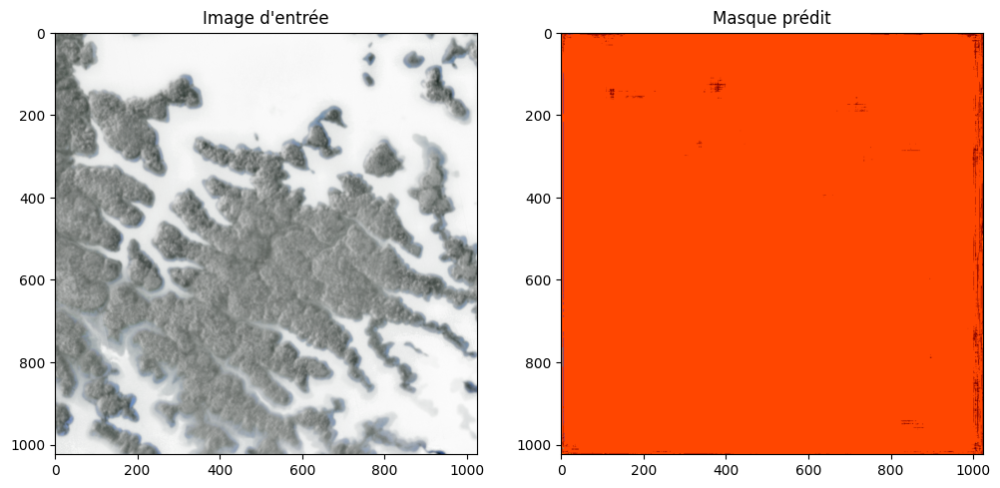

In [ ]:
# Visualisation de la première image et son masque prédit
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
image = images[0].permute(1, 2, 0).cpu().numpy()
image = (image - image.min()) / (image.max() - image.min())
plt.imshow(image)
plt.title("Image d'entrée")

plt.subplot(1, 2, 2)
plt.imshow(predicted_masks[0], cmap="jet")  # Masque de segmentation prédit
plt.title("Masque prédit")

plt.show()

In [ ]:
import torch
import segmentation_models_pytorch as smp

# Charger un modèle U-Net pré-entraîné avec un backbone ResNet34
model = smp.Unet(
    encoder_name="resnet34",  # Backbone pré-entraîné
    encoder_weights="imagenet",  # Charger les poids ImageNet
    in_channels=3,  # 3 canaux pour une image RGB
    classes=7  # Nombre de classes pour la segmentation (7 dans ton cas)
)

/home/ids/amalfoy-24/Computer_Vision_Projet/.env_computer_vision/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /home/ids/amalfoy-24/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:02<00:00, 38.8MB/s]


In [ ]:
# Créer une image d'entrée aléatoire
input_image = torch.randn(1, 3, 1024, 1024)  # Image de forme [1, 3, 1024, 1024]

# Faire une prédiction
output = model(input_image)

# Afficher la forme de la sortie
print(f"Output shape: {output.shape}")